In [1]:
%matplotlib inline
%pylab inline
import xarray as xr
import pandas as pd
import datetime
import glob
import matplotlib.dates as mdates
import gsw
import glidertools as gt
from tqdm.notebook import tqdm_notebook as tqdm
from cmocean import cm as cmo  
import matplotlib.cm as cm
import os
import pathlib
import cartopy.crs as ccrs
import matplotlib
from matplotlib.ticker import MaxNLocator
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import matplotlib.image as mpimg
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import scipy
import numpy as np
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import seaborn as sns
from matplotlib.animation import FuncAnimation
import cartopy.feature as cfeature
import scipy.signal as sg  #Package for signal analysis
import scipy.ndimage as si #Another package for signal analysis
#from scipy.interpolate import interp1d  #for converting cell to grid-centered coordinates
#from scipy import stats    #Used for 2D binned statistics
#from mpl_toolkits.axes_grid1 import make_axes_locatable #For plotting interior colobars
#import cartopy.crs as ccrs
from scipy import stats
#from scipy import signal, ndimage
from scipy import fft as spfft
from scipy.fft import fft 
from scipy.stats import chi2
from scipy.special import digamma
#function for coverting Matlab's datenum into Python's datetime
#from https://gist.github.com/victorkristof/b9d794fe1ed12e708b9d
#with modifications to support array input and output

mpl.rcParams['animation.ffmpeg_path'] = r"/Users/xedhjo/Documents/Python/extra/ffmpeg"

font = {'family' : 'Avenir',
        'weight' : 'normal',
        'size'   : 20}
matplotlib.rc('font', **font)

mpl.rcParams['xtick.major.size'] = 4
mpl.rcParams['xtick.major.width'] = 1
mpl.rcParams['xtick.minor.size'] = 4
mpl.rcParams['xtick.minor.width'] = 1
mpl.rcParams['ytick.major.size'] = 4
mpl.rcParams['ytick.major.width'] = 1
mpl.rcParams['ytick.minor.size'] = 4
mpl.rcParams['ytick.minor.width'] = 1

from IPython.display import display, Markdown

def print_with_font_size(text, fs=20):
    # Format the output with the desired font size
    print_output = f"<span style='font-size: {fs}px;'>{text}</span>"
    display(Markdown(print_output))

print = print_with_font_size

def rot_ticks(axs,rot,ha):
    for xlabels in axs.get_xticklabels():
                xlabels.set_rotation(rot)
                xlabels.set_ha(ha)
                
def time_ticks_h(ax,interval=[0,6,12,18]):
    ax.xaxis.set_minor_locator(mdates.HourLocator(interval))
    ax.xaxis.set_minor_formatter(mdates.DateFormatter("%H:%M"))
    ax.xaxis.set_major_locator(mdates.DayLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%H:%M\n%d %b"))
    
def time_ticks_d(ax,majint,minint):
    ax.xaxis.set_minor_locator(mdates.HourLocator(minint))
    ax.xaxis.set_minor_formatter(mdates.DateFormatter(""))
    ax.xaxis.set_major_locator(mdates.DayLocator(majint))
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%d %b"))
    
def gridlines(ax,lon_tick,lat_tick):
    
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      x_inline=False, y_inline=False,
                  linewidth=0.75, alpha=0.5, linestyle='--',ylocs = matplotlib.ticker.MultipleLocator(base=lat_tick),xlocs = matplotlib.ticker.MultipleLocator(base=lon_tick))
    gl.top_labels = False
    gl.right_labels = False
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER

    gl.xpadding=10
    gl.ypadding=10
    
def corfreq(lat):
    """
    The Coriolis frequency in rad / day at a given latitude.
    
    Parameters
    ----------
        lat: Latitude in degree
        
    Returns:
        The Coriolis frequecy at latitude lat
    """    
    omega=7.2921159e-5;
    return 2*np.sin(lat*2*np.pi/360)*omega*(3600)*24


def fix_xticks(ax,ds):
    
    if (ds.time[-1] - ds.time[0]).data.astype('timedelta64[D]') < 1 :
        ax[0].xaxis.set_minor_locator(mdates.HourLocator())
        ax[0].xaxis.set_major_locator(mdates.HourLocator(np.arange(0,24,3)))
        ax[0].xaxis.set_major_formatter(mdates.DateFormatter("%H:%M"))
        ax[0].xaxis.set_minor_formatter(mdates.DateFormatter(""))
        #ax[3].set_xlabel(f"{ds.time[0].values.astype('datetime64[D]')}",loc='left')

    if ((ds.time[-1] - ds.time[0]).data.astype('timedelta64[D]') > 1) and ((ds.time[-1] - ds.time[0]).data.astype('timedelta64[D]') < 7):
        ax[0].xaxis.set_minor_locator(mdates.HourLocator([0,12]))
        ax[0].xaxis.set_major_locator(mdates.DayLocator(np.arange(1,32,1)))
        ax[0].xaxis.set_major_formatter(mdates.DateFormatter("%d\n%b"))
        ax[0].xaxis.set_minor_formatter(mdates.DateFormatter("%H:%M"))

    if ((ds.time[-1] - ds.time[0]).data.astype('timedelta64[D]') > 6) and ((ds.time[-1] - ds.time[0]).data.astype('timedelta64[D]') < 15):
        ax[0].xaxis.set_minor_locator(mdates.DayLocator(np.arange(1,32,1)))
        ax[0].xaxis.set_major_locator(mdates.DayLocator(np.arange(2,32,2)))
        ax[0].xaxis.set_major_formatter(mdates.DateFormatter("%d\n%b"))
        ax[0].xaxis.set_minor_formatter(mdates.DateFormatter(""))
        ax[-1].set_xlabel('2023')

    if ((ds.time[-1] - ds.time[0]).data.astype('timedelta64[D]') > 14) and ((ds.time[-1] - ds.time[0]).data.astype('timedelta64[D]') < 31):
        ax[0].xaxis.set_minor_locator(mdates.DayLocator(np.arange(1,32,1)))
        ax[0].xaxis.set_major_locator(mdates.DayLocator([5,10,15,20,25,30]))
        ax[0].xaxis.set_major_formatter(mdates.DateFormatter("%d\n%b"))
        #ax[0].xaxis.set_minor_formatter(mdates.DateFormatter("%d"))

    if ((ds.time[-1] - ds.time[0]).data.astype('timedelta64[D]') > 30):
        ax[0].xaxis.set_major_locator(mdates.MonthLocator())
        ax[0].xaxis.set_minor_locator(mdates.DayLocator([1,5,10,15,20,25]))
        ax[0].xaxis.set_major_formatter(mdates.DateFormatter("%d\n%B"))
        ax[0].xaxis.set_minor_formatter(mdates.DateFormatter("%d"))

    if ((ds.time[-1] - ds.time[0]).data.astype('timedelta64[D]') > 360):
        ax[0].xaxis.set_minor_locator(mdates.MonthLocator([1,4,7,10]))
        ax[0].xaxis.set_major_locator(mdates.YearLocator())
        ax[0].xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
        ax[0].xaxis.set_minor_formatter(mdates.DateFormatter("%b"))
    
    rot_ticks(ax[-1],0,'center')



wind_c2 = ListedColormap(['#FCC681','#FF819E','#FF819E','#A0A3E0','#A0A3E0','#99D4E5','#99D4E5','#FCC681']) # Soft pastels, use this

kc = '#006699'
sdc = '#ff6600'
ppc = 'crimson'



%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


# Load the data

In [2]:
sb = xr.open_dataset('/Users/xedhjo/Documents/Projects/QUICCHE/data/sailbuoy/PimPim/full/DATA.nc')

sb['doy'] = xr.DataArray(mdates.date2num(sb['time']) - mdates.date2num(np.datetime64('2023-01-02')),dims='time')
sb['mday'] = xr.DataArray(mdates.date2num(sb['time']) - mdates.date2num(sb['time'].values[0]),dims='time')
sb = sb.set_coords('doy')

ds = xr.open_dataset('/Users/xedhjo/Documents/Projects/2023_Validating_Sailbuoy/data/ERA5_QUICCHE.nc').mean('expver',keep_attrs=True)

# Sailbuoy vs ERA5

## Theory

From [ECMWF](https://confluence.ecmwf.int/pages/viewpage.action?pageId=171411214):

> Near-surface humidity is not archived directly in ERA datasets, but the archive contains near-surface (2m from the surface) temperature (T) and dew point temperature (Td), and also surface pressure (sp), from which you can calculate specific and relative humidity at 2m.
>
>**Specific humidity** can be calculated using equations 7.4 and 7.5 from Part IV, Physical processes section (Chapter 7, section 7.2.1b) in the [documentation of the IFS for CY41R2](https://www.ecmwf.int/en/publications/ifs-documentation). Use the 2m dew point temperature and surface pressure (which is approximately equal to the pressure at 2m) in these equations. The constants in 7.4 are to be found in Chapter 12 (of Part IV: Physical processes) and the parameters in 7.5 should be set for saturation over water because the dew point temperature is being used. <br>
>**Relative humidity** should be calculated from: <img src="https://latex.codecogs.com/svg.image?&space;RH&space;=&space;100\cdot\frac{e_s(T_d)}{e_s(T)}" title="https://latex.codecogs.com/svg.image? RH = 100 \cdot \frac{e_s(T_d)}{e_s(T)}" /> 


Dew point temperature is the temperature where saturation water vapor pressure <img src="https://latex.codecogs.com/svg.image?\large&space;e_s" title="https://latex.codecogs.com/svg.image?\large e_s" /> is reached. Using equation 7.5 from the document above: <br>
<img src="https://latex.codecogs.com/svg.image?\huge&space;e_s(T)&space;=&space;a_1&space;\cdot&space;e^{a_3&space;\frac{T-T_0}{T-a_4}}" title="https://latex.codecogs.com/svg.image?\huge e_s(T) = a_1 \cdot e^{a_3 \frac{T-T_0}{T-a_4}}" />, <br>
we can calculate both <img src="https://latex.codecogs.com/svg.image?\large&space;e_s(T)" title="https://latex.codecogs.com/svg.image?\large e_s(T)" />  and <img src="https://latex.codecogs.com/svg.image?\large e_s(T_d)" title="https://latex.codecogs.com/svg.image?\large e_s(T_d)" /> with the following:

<img src="https://latex.codecogs.com/svg.image?\large&space;T" title="https://latex.codecogs.com/svg.image?\large T" /> [°C] (ambient Temperature) <br>
<img src="https://latex.codecogs.com/svg.image?\large&space;T_d" title="https://latex.codecogs.com/svg.image?\large T_d" /> [°C] (dew point temperature) <br>
<img src="https://latex.codecogs.com/svg.image?\large&space;a_1 = 611.21" title="https://latex.codecogs.com/svg.image?\large a_1 = 611.21" /> [Pa] <br>
<img src="https://latex.codecogs.com/svg.image?\large&space;a_3 = 17.502" title="https://latex.codecogs.com/svg.image?\large a_3 = 17.502" /> [-] <br>
<img src="https://latex.codecogs.com/svg.image?\large&space;a_4 = 32.19" title="https://latex.codecogs.com/svg.image?\large a_4 = 32.19" /> [K] <br>
<img src="https://latex.codecogs.com/svg.image?\large&space;T_0 = 273.16" title="https://latex.codecogs.com/svg.image?\large T_0 = 273.16" /> [K] <br>

In [3]:
def calc_es(ds,T):
    a1 = 611.21
    a3 = 17.502
    a4 = 32.19
    T0 = 273.16
    es = a1 * np.exp(a3 * (ds[T].values-T0)/(ds[T].values)-a4)
    return es

def calc_RH(ds):
    RH = calc_es(ds,'d2m') / calc_es(ds,'t2m')
    return RH

## Bin and colocate data 

In [4]:
sb_1h = sb.reset_coords().drop('dcps_time').resample(time='1h').mean('time')
sb_1h = sb_1h.where(np.isfinite(sb_1h['wind_speed']),drop=True)
sb_1h = sb_1h.interpolate_na('time')
t = sb_1h.time.values

lat = (np.round(sb_1h['latitude'].interpolate_na('time') * 4) / 4)
lon = (np.round(sb_1h['longitude'].interpolate_na('time') * 4) / 4)

   
temp = []
for i in range(len(t)):
    temp.append(ds.sel(time=t[i]).sel(longitude=lon[i]).sel(latitude=lat[i]))
    
era5 = xr.concat(temp,dim='time')
era5['wind_speed'] = np.sqrt(era5['u10']**2 + era5['v10']**2)
era5['wind_dir'] = ('time'), ((np.arctan2(era5['u10'],era5['v10']) * 180 / np.pi + 180) % 360).values
era5['doy'] = sb_1h['doy']
era5 = era5.set_coords('doy')
sb_1h = sb_1h.set_coords('doy')

era5['rh'] = ('time'), calc_RH(era5) * 100

## Plotting functions

In [5]:
def calc_rmse(era5,sb,eravar,sbvar):
    return float(np.round(np.sqrt(np.mean(np.square(era5[eravar].values - sb[sbvar].values))),2))

In [6]:
def plot_ts_sct(era5,sb,eravar,sbvar,sbc,ax,bx,bins,doy=True):
    
    # Plot time series
    if doy == True:
        era5[eravar].swap_dims({'time':'doy'}).plot(x='doy',ax=ax,zorder=2,c='k',lw=2)
        sb[sbvar].swap_dims({'time':'doy'}).plot(x='doy',ax=ax,zorder=3,c=sbc,lw=2)
    else:
        era5[eravar].plot(ax=ax,zorder=2,c='k',lw=2)
        sb[sbvar].plot(ax=ax,zorder=3,c=sbc,lw=2)
        fix_xticks([ax],era5)
        
        
    # Calculate statistics
    s,i,r,p,stderr = stats.linregress(sb[sbvar],era5[eravar])
    m, b = np.polyfit(sb[sbvar], era5[eravar], 1)
    # Scatter plot and stats
    #bx.scatter(sb[sbvar],era5[eravar],alpha=1,ec=None,c=sbc)
    h=bx.hist2d(sb[sbvar],era5[eravar],bins=[bins,bins],cmin=1,cmap=cmo.amp)
    cax = inset_axes(bx, width="40%", height="5%", loc='upper left')#, bbox_to_anchor=(0.05, 0.05, 1, 1))
    cbar = plt.colorbar(h[3], cax=cax, ax=bx,label='Count',orientation='horizontal')
    cbar.ax.xaxis.set_major_locator(MaxNLocator(integer=True, nbins=3))  # Set ticks as integers
    bx.set_title(f"y = {s.round(2)}x + {i.round(2)}",loc='right',y=0.05,x=0.975,c='k',fontsize=16)
    bxx = bx.twinx()
    bxx.set_title(r"r$^{2}$ = " + str((r**2).round(2)),loc='right',y=0.15,x=0.975,c='k',fontsize=16)
    bxx.axis('off')
    bxxx = bxx.twinx()
    bxxx.set_title(f"RMSE = {np.round(calc_rmse(era5,sb,eravar,sbvar),2)}",loc='right',y=0.25,x=0.975,c='k',fontsize=16)
    bxxx.axis('off')
    bxxxx = bxxx.twinx()
    bxxxx.set_title(f"n = {len(era5['time'])}",loc='right',y=0.35,x=0.975,c='k',fontsize=16)
    bxxxx.axis('off')

    # bx.plot([np.min(sb[sbvar].values),np.max(sb[sbvar].values)],
    #         [np.min(sb[sbvar].values) + i.round(3),
    #          np.max(sb[sbvar].values)*s.round(3)+i.round(3)],ls='--',c='k',lw=3)
    bx.plot(sb[sbvar].values,m*sb[sbvar].values + b,ls='-',c='k',lw=3)
    bx.plot([sb[sbvar].values.min(),sb[sbvar].values.max()],[sb[sbvar].values.min(),sb[sbvar].values.max()],ls='--',c='k',lw=3)

    
    bx.grid()
    # bx.set(xlim=(50,150),ylim=(50,150))
    bx.axis('equal')
    
    return s,i,m,b

## Plotting

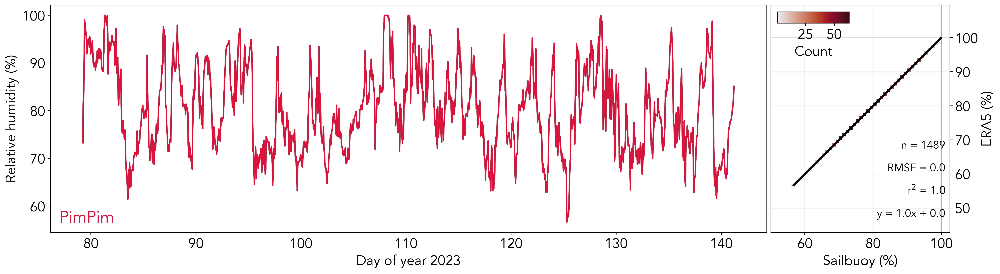

In [6]:
figprops = dict(figsize=(20, 10), dpi=300)
fig = plt.figure(layout="constrained",**figprops)
spec = fig.add_gridspec(nrows=2,ncols=5)

ax = fig.add_subplot(spec[0, :4])
bx = fig.add_subplot(spec[0, 4])#,sharey=ax)

eravar = 'rh'
ppvar = 'rh'

plot_ts_sct(sb_1h,sb_1h,ppvar,ppvar,ppc,ax,bx,np.arange(50,100,1))

ax.set(xlabel='Day of year 2023',ylabel='Relative humidity (%)')
bx.set(xlabel='Sailbuoy (%)',ylabel='ERA5 (%)')
ax.set_title('PimPim',loc='left',y=0.025,x=0.012,c=ppc)
#ax.set_title('ERA5',loc='right',y=0.025,x=0.012,c='k',ha='left')
#plt.setp(ax.get_xticklabels(), visible=False)
bx.yaxis.tick_right()
bx.yaxis.set_label_position("right")

# ratio = (bx.get_ylim()[1] - bx.get_ylim()[0]) / (bx.get_xlim()[1] - bx.get_xlim()[0])
# bx.set_xlim(80,100)
# bx.set_ylim()


plt.show()

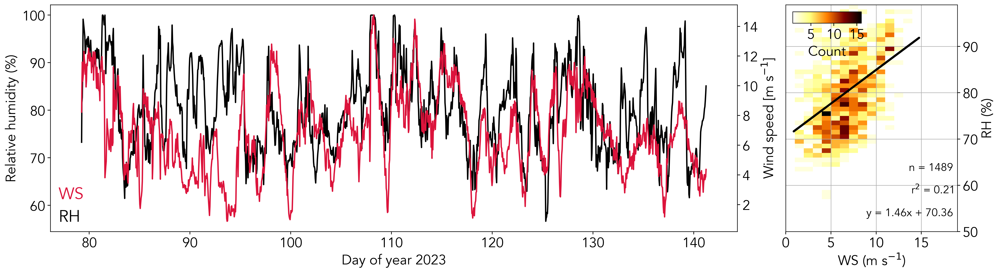

In [6]:
figprops = dict(figsize=(20, 10), dpi=300)
fig = plt.figure(layout="constrained",**figprops)
spec = fig.add_gridspec(nrows=2,ncols=5)

ax = fig.add_subplot(spec[0, :4])
bx = fig.add_subplot(spec[0, 4])#,sharey=ax)

eravar = 'rh'
sbvar = 'wind_speed'
era5 = sb_1h
sb = sb_1h
sbc = ppc

# Plot time series

era5[eravar].swap_dims({'time':'doy'}).plot(x='doy',ax=ax,zorder=2,c='k',lw=2)
sb[sbvar].swap_dims({'time':'doy'}).plot(x='doy',zorder=3,c=sbc,lw=2,ax=ax.twinx())

# Calculate statistics
s,i,r,p,stderr = stats.linregress(sb[sbvar],era5[eravar])
m, b = np.polyfit(sb[sbvar], era5[eravar], 1)
# Scatter plot and stats
# bx.scatter(sb[sbvar],era5[eravar],alpha=1,ec=None,c=sbc)
h=bx.hist2d(sb[sbvar],era5[eravar],bins=[np.arange(0,20,1),np.arange(50,100,1)],cmin=1,cmap='afmhot_r')
cax = inset_axes(bx, width="40%", height="5%", loc='upper left')#, bbox_to_anchor=(0.05, 0.05, 1, 1))
cbar = plt.colorbar(h[3], cax=cax, ax=bx,label='Count',orientation='horizontal')
cbar.ax.xaxis.set_major_locator(MaxNLocator(integer=True, nbins=3))  # Set ticks as integers
bx.set_title(f"y = {s.round(2)}x + {i.round(2)}",loc='right',y=0.05,x=0.975,c='k',fontsize=16)
bxx = bx.twinx()
bxx.set_title(r"r$^{2}$ = " + str((r**2).round(2)),loc='right',y=0.15,x=0.975,c='k',fontsize=16)
bxx.axis('off')
bxxxx = bxx.twinx()
bxxxx.set_title(f"n = {len(era5['time'])}",loc='right',y=0.25,x=0.975,c='k',fontsize=16)
bxxxx.axis('off')

bx.plot(sb[sbvar].values,m*sb[sbvar].values + b,ls='-',c='k',lw=3)
bx.plot([sb[sbvar].values.min(),sb[sbvar].values.max()],[sb[sbvar].values.min(),sb[sbvar].values.max()],ls='--',c='k',lw=3)
bx.grid()

ax.set(xlabel='Day of year 2023',ylabel='Relative humidity (%)')
bx.set(xlabel='WS (m s$^{-1}$)',ylabel='RH (%)')
ax.set_title('WS',loc='left',y=0.125,x=0.012,c=ppc)
ax.set_title('RH',loc='right',y=0.025,x=0.012,c='k',ha='left')
#plt.setp(ax.get_xticklabels(), visible=False)
bx.yaxis.tick_right()
bx.yaxis.set_label_position("right")

plt.show()

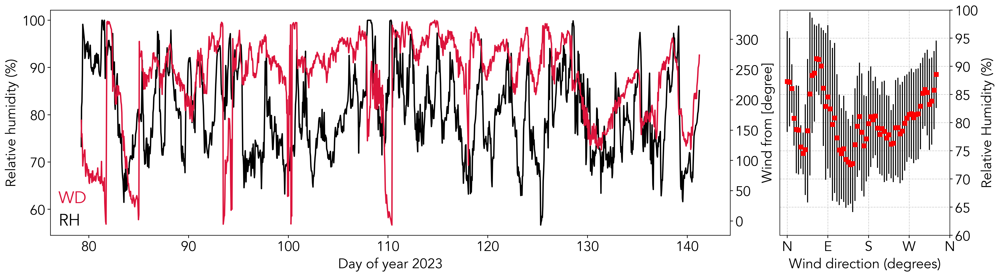

In [43]:
figprops = dict(figsize=(20, 10), dpi=300)
fig = plt.figure(layout="constrained",**figprops)
spec = fig.add_gridspec(nrows=2,ncols=5)

ax = fig.add_subplot(spec[0, :4])
bx = fig.add_subplot(spec[0, 4])#,sharey=ax)

eravar = 'rh'
sbvar = 'wind_dir'
era5 = sb_1h
sb = sb_1h
sbc = ppc

# Plot time series

era5[eravar].swap_dims({'time':'doy'}).plot(x='doy',ax=ax,zorder=2,c='k',lw=2)
sb[sbvar].swap_dims({'time':'doy'}).plot(x='doy',zorder=3,c=sbc,lw=2,ax=ax.twinx())

# Calculate statistics
s,i,r,p,stderr = stats.linregress(sb[sbvar],era5[eravar])
m, b = np.polyfit(sb[sbvar], era5[eravar], 1)
# Scatter plot and stats
# bx.scatter(sb[sbvar],era5[eravar],alpha=1,ec=None,c=sbc)

# h=bx.hist2d(sb[sbvar],era5[eravar],bins=[np.arange(0,360,15),np.arange(50,100,1)],cmin=1,cmap=cmo.amp)
# cax = inset_axes(bx, width="40%", height="5%", loc='upper left')#, bbox_to_anchor=(0.05, 0.05, 1, 1))
# cbar = plt.colorbar(h[3], cax=cax, ax=bx,label='Count',orientation='horizontal')
# cbar.ax.xaxis.set_major_locator(MaxNLocator(integer=True, nbins=3))  # Set ticks as integers
# bx.set_title(f"y = {s.round(2)}x + {i.round(2)}",loc='right',y=0.05,x=0.975,c='k',fontsize=16)
# bxx = bx.twinx()
# bxx.set_title(r"r$^{2}$ = " + str((r**2).round(2)),loc='right',y=0.15,x=0.975,c='k',fontsize=16)
# bxx.axis('off')
# bxxxx = bxx.twinx()
# bxxxx.set_title(f"n = {len(era5['time'])}",loc='right',y=0.25,x=0.975,c='k',fontsize=16)
# bxxxx.axis('off')
# bx.plot(sb[sbvar].values,m*sb[sbvar].values + b,ls='-',c='k',lw=3)
# bx.plot([sb[sbvar].values.min(),sb[sbvar].values.max()],[sb[sbvar].values.min(),sb[sbvar].values.max()],ls='--',c='k',lw=3)
# bx.grid()


var = sb_1h['rh']

for i in np.arange(0, 360, 5):
    
    idx = ((sb_1h['wind_dir'] > i) & (sb_1h['wind_dir'] < i + 10))
        
    mean = np.mean(var[idx])
    std = np.std(var[idx])
   
    bx.errorbar(i, mean, yerr=std, c='k')
    bx.scatter(i, mean, c='r', zorder=10, marker='s')


bx.grid(ls='--', c='0.8')


ax.set(xlabel='Day of year 2023',ylabel='Relative humidity (%)')
bx.set(xlabel='Wind direction (degrees)',ylabel='Relative Humidity (%)',ylim=(60,100))
ax.set_title('WD',loc='left',y=0.125,x=0.012,c=ppc)
ax.set_title('RH',loc='right',y=0.025,x=0.012,c='k',ha='left')
#plt.setp(ax.get_xticklabels(), visible=False)
bx.yaxis.tick_right()
bx.yaxis.set_label_position("right")
bx.xaxis.set_ticks([0, 90, 180, 270, 360])
bx.xaxis.set_ticklabels(['N', 'E', 'S', 'W', 'N'])

plt.show()

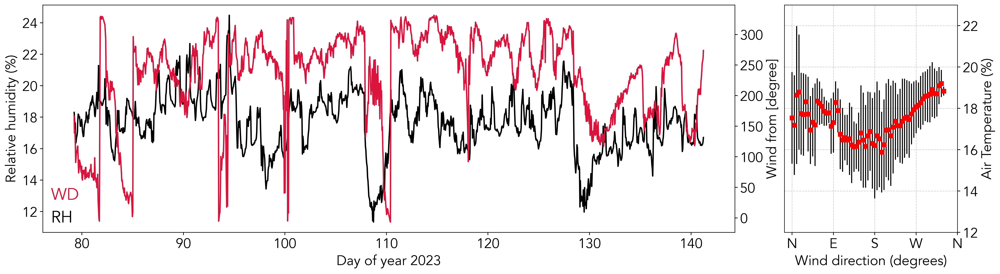

In [42]:
figprops = dict(figsize=(20, 10), dpi=300)
fig = plt.figure(layout="constrained",**figprops)
spec = fig.add_gridspec(nrows=2,ncols=5)

ax = fig.add_subplot(spec[0, :4])
bx = fig.add_subplot(spec[0, 4])#,sharey=ax)

eravar = 'air_t'
sbvar = 'wind_dir'
era5 = sb_1h
sb = sb_1h
sbc = ppc

# Plot time series

era5[eravar].swap_dims({'time':'doy'}).plot(x='doy',ax=ax,zorder=2,c='k',lw=2)
sb[sbvar].swap_dims({'time':'doy'}).plot(x='doy',zorder=3,c=sbc,lw=2,ax=ax.twinx())

# Calculate statistics
s,i,r,p,stderr = stats.linregress(sb[sbvar],era5[eravar])
m, b = np.polyfit(sb[sbvar], era5[eravar], 1)
# Scatter plot and stats
# bx.scatter(sb[sbvar],era5[eravar],alpha=1,ec=None,c=sbc)

# h=bx.hist2d(sb[sbvar],era5[eravar],bins=[np.arange(0,360,15),np.arange(50,100,1)],cmin=1,cmap=cmo.amp)
# cax = inset_axes(bx, width="40%", height="5%", loc='upper left')#, bbox_to_anchor=(0.05, 0.05, 1, 1))
# cbar = plt.colorbar(h[3], cax=cax, ax=bx,label='Count',orientation='horizontal')
# cbar.ax.xaxis.set_major_locator(MaxNLocator(integer=True, nbins=3))  # Set ticks as integers
# bx.set_title(f"y = {s.round(2)}x + {i.round(2)}",loc='right',y=0.05,x=0.975,c='k',fontsize=16)
# bxx = bx.twinx()
# bxx.set_title(r"r$^{2}$ = " + str((r**2).round(2)),loc='right',y=0.15,x=0.975,c='k',fontsize=16)
# bxx.axis('off')
# bxxxx = bxx.twinx()
# bxxxx.set_title(f"n = {len(era5['time'])}",loc='right',y=0.25,x=0.975,c='k',fontsize=16)
# bxxxx.axis('off')
# bx.plot(sb[sbvar].values,m*sb[sbvar].values + b,ls='-',c='k',lw=3)
# bx.plot([sb[sbvar].values.min(),sb[sbvar].values.max()],[sb[sbvar].values.min(),sb[sbvar].values.max()],ls='--',c='k',lw=3)
# bx.grid()


var = sb_1h['air_t']

for i in np.arange(0, 360, 5):
    
    idx = ((sb_1h['wind_dir'] > i) & (sb_1h['wind_dir'] < i + 10))
        
    mean = np.mean(var[idx])
    std = np.std(var[idx])
   
    bx.errorbar(i, mean, yerr=std, c='k')
    bx.scatter(i, mean, c='r', zorder=10, marker='s')


bx.grid(ls='--', c='0.8')


ax.set(xlabel='Day of year 2023',ylabel='Relative humidity (%)')
bx.set(xlabel='Wind direction (degrees)',ylabel='Air Temperature (%)',ylim=(12,23))
ax.set_title('WD',loc='left',y=0.125,x=0.012,c=ppc)
ax.set_title('RH',loc='right',y=0.025,x=0.012,c='k',ha='left')
#plt.setp(ax.get_xticklabels(), visible=False)
bx.yaxis.tick_right()
bx.yaxis.set_label_position("right")
bx.xaxis.set_ticks([0, 90, 180, 270, 360])
bx.xaxis.set_ticklabels(['N', 'E', 'S', 'W', 'N'])

plt.show()

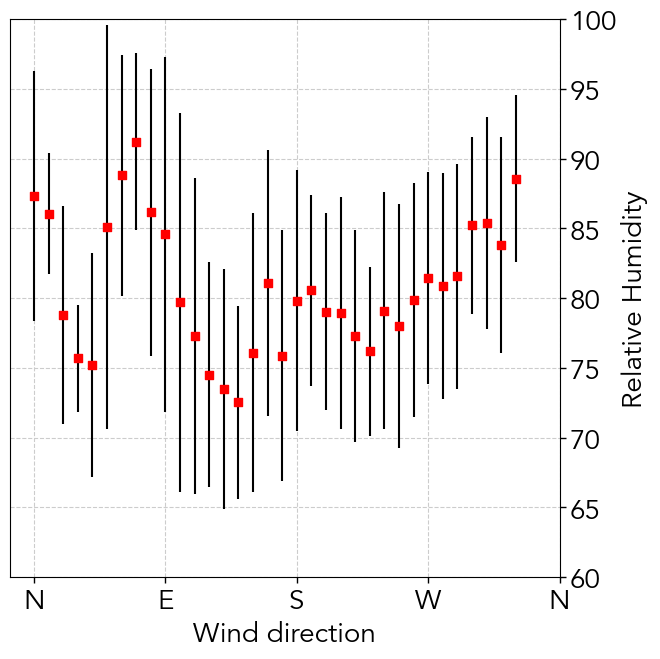

In [15]:
fig,ax=plt.subplots(figsize=(7,7))

dT_airsea = sb_1h['rh']

for i in np.arange(0, 360, 10):
    
    idx = ((sb_1h['wind_dir'] > i) & (sb_1h['wind_dir'] < i + 10))
        
    mean = np.mean(dT_airsea[idx])
    std = np.std(dT_airsea[idx])
   
    ax.errorbar(i, mean, yerr=std, c='k')
    ax.scatter(i, mean, c='r', zorder=10, marker='s')
    
ax.xaxis.set_ticks([0, 90, 180, 270, 360]); ax.xaxis.set_ticklabels(['N', 'E', 'S', 'W', 'N'])

ax.set_ylabel('Relative Humidity')
ax.set_xlabel('Wind direction')

ax.set_ylim(60,100)

ax.grid(ls='--', c='0.8')

# ax.yaxis.set_ticks(np.arange(0, 18, 3))
ax.yaxis.tick_right()
ax.yaxis.set_label_position("right")


fig.tight_layout()

Text(0.5, 0, 'Wind direction')

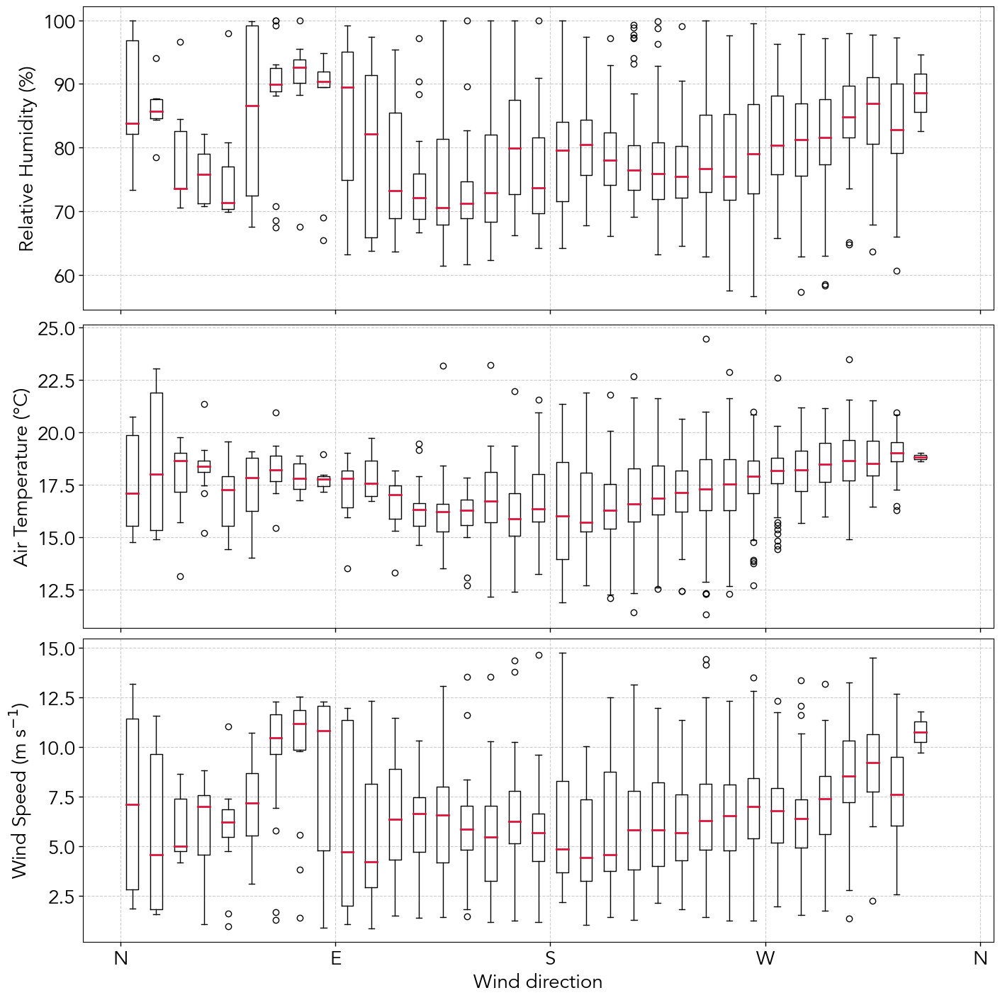

In [77]:
fig,ax=plt.subplots(3,1,figsize=(14,14),constrained_layout=True,sharex=True)

da = 10

for i in np.arange(0, 360+da, da):
    idx = ((sb_1h['wind_dir'] >= i) & (sb_1h['wind_dir'] < i + da))
    ax[0].boxplot(sb_1h['rh'][idx],positions=[i+da/2],widths=da/2, medianprops=dict(color=ppc,lw=2))
    ax[1].boxplot(sb_1h['air_t'][idx],positions=[i+da/2],widths=da/2, medianprops=dict(color=ppc,lw=2))
    ax[2].boxplot(sb_1h['wind_speed'][idx],positions=[i+da/2],widths=da/2, medianprops=dict(color=ppc,lw=2))

for i,axs in enumerate(ax):
    axs.xaxis.set_ticks([0, 90, 180, 270, 360],labels=['N', 'E', 'S', 'W', 'N'])

    axs.set_ylabel(['Relative Humidity (%)', 'Air Temperature (°C)', 'Wind Speed (m s$^{-1}$)'][i])
    axs.grid(ls='--', c='0.8')

ax[-1].set_xlabel('Wind direction')


KeyError: 't2mc'

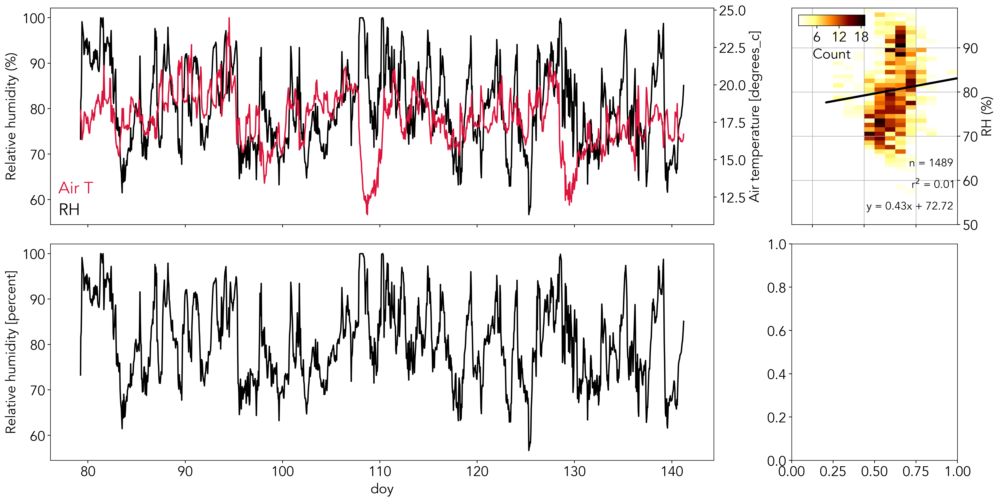

In [7]:
figprops = dict(figsize=(20, 10), dpi=300)
fig = plt.figure(layout="constrained",**figprops)
spec = fig.add_gridspec(nrows=2,ncols=5)

ax = fig.add_subplot(spec[0, :4])
bx = fig.add_subplot(spec[0, 4])#,sharey=ax)

eravar = 'rh'
sbvar = 'air_t'
temp2 = sb_1h
temp1 = sb_1h
sbc = ppc

# Plot time series

temp2[eravar].swap_dims({'time':'doy'}).plot(x='doy',ax=ax,zorder=2,c='k',lw=2)
temp1[sbvar].swap_dims({'time':'doy'}).plot(x='doy',zorder=3,c=sbc,lw=2,ax=ax.twinx())

# Calculate statistics
s,i,r,p,stderr = stats.linregress(temp1[sbvar],temp2[eravar])
m, b = np.polyfit(temp1[sbvar], temp2[eravar], 1)
# Scatter plot and stats
# bx.scatter(temp1[sbvar],temp2[eravar],alpha=1,ec=None,c=sbc)
h=bx.hist2d(temp1[sbvar],temp2[eravar],bins=[np.arange(8,25,1),np.arange(50,100,1)],cmin=1,cmap='afmhot_r')
cax = inset_axes(bx, width="40%", height="5%", loc='upper left')#, bbox_to_anchor=(0.05, 0.05, 1, 1))
cbar = plt.colorbar(h[3], cax=cax, ax=bx,label='Count',orientation='horizontal')
cbar.ax.xaxis.set_major_locator(MaxNLocator(integer=True, nbins=3))  # Set ticks as integers
bx.set_title(f"y = {s.round(2)}x + {i.round(2)}",loc='right',y=0.05,x=0.975,c='k',fontsize=16)
bxx = bx.twinx()
bxx.set_title(r"r$^{2}$ = " + str((r**2).round(2)),loc='right',y=0.15,x=0.975,c='k',fontsize=16)
bxx.axis('off')
bxxxx = bxx.twinx()
bxxxx.set_title(f"n = {len(temp2['time'])}",loc='right',y=0.25,x=0.975,c='k',fontsize=16)
bxxxx.axis('off')

bx.plot(temp1[sbvar].values,m*temp1[sbvar].values + b,ls='-',c='k',lw=3)
bx.plot([temp1[sbvar].values.min(),temp1[sbvar].values.max()],[temp1[sbvar].values.min(),temp1[sbvar].values.max()],ls='--',c='k',lw=3)
bx.grid()

ax.set(xlabel='',ylabel='Relative humidity (%)')
bx.set(xlabel='',ylabel='RH (%)')
ax.set_title('Air T',loc='left',y=0.125,x=0.012,c=ppc)
ax.set_title('RH',loc='right',y=0.025,x=0.012,c='k',ha='left')
#plt.setp(ax.get_xticklabels(), visible=False)
bx.yaxis.tick_right()
bx.yaxis.set_label_position("right")
plt.setp(ax.get_xticklabels(), visible=False)
plt.setp(bx.get_xticklabels(), visible=False)

ax = fig.add_subplot(spec[1, :4])
bx = fig.add_subplot(spec[1, 4])#,sharey=ax)

eravar = 'rh'
sbvar = 't2mc'
temp2 = era5
temp1 = era5
sbc = ppc

# Plot time series

temp2[eravar].swap_dims({'time':'doy'}).plot(x='doy',ax=ax,zorder=2,c='k',lw=2)
temp1[sbvar].swap_dims({'time':'doy'}).plot(x='doy',zorder=3,c=sbc,lw=2,ax=ax.twinx())

# Calculate statistics
s,i,r,p,stderr = stats.linregress(temp1[sbvar],temp2[eravar])
m, b = np.polyfit(temp1[sbvar], temp2[eravar], 1)
# Scatter plot and stats
# bx.scatter(temp1[sbvar],temp2[eravar],alpha=1,ec=None,c=sbc)
h=bx.hist2d(temp1[sbvar],temp2[eravar],bins=[np.arange(8,25,1),np.arange(50,100,1)],cmin=1,cmap='afmhot_r')
cax = inset_axes(bx, width="40%", height="5%", loc='upper left')#, bbox_to_anchor=(0.05, 0.05, 1, 1))
cbar = plt.colorbar(h[3], cax=cax, ax=bx,label='Count',orientation='horizontal')
cbar.ax.xaxis.set_major_locator(MaxNLocator(integer=True, nbins=3))  # Set ticks as integers
bx.set_title(f"y = {s.round(2)}x + {i.round(2)}",loc='right',y=0.05,x=0.975,c='k',fontsize=16)
bxx = bx.twinx()
bxx.set_title(r"r$^{2}$ = " + str((r**2).round(2)),loc='right',y=0.15,x=0.975,c='k',fontsize=16)
bxx.axis('off')
bxxxx = bxx.twinx()
bxxxx.set_title(f"n = {len(temp2['time'])}",loc='right',y=0.25,x=0.975,c='k',fontsize=16)
bxxxx.axis('off')

bx.plot(temp1[sbvar].values,m*temp1[sbvar].values + b,ls='-',c='k',lw=3)
bx.plot([temp1[sbvar].values.min(),temp1[sbvar].values.max()],[temp1[sbvar].values.min(),temp1[sbvar].values.max()],ls='--',c='k',lw=3)
bx.grid()

ax.set(xlabel='Day of year 2023',ylabel='Relative humidity (%)')
bx.set(xlabel='Air T (°C)',ylabel='RH (%)')
ax.set_title('Air T',loc='left',y=0.125,x=0.012,c=ppc)
ax.set_title('RH',loc='right',y=0.025,x=0.012,c='k',ha='left')
bx.yaxis.tick_right()
bx.yaxis.set_label_position("right")


plt.show()

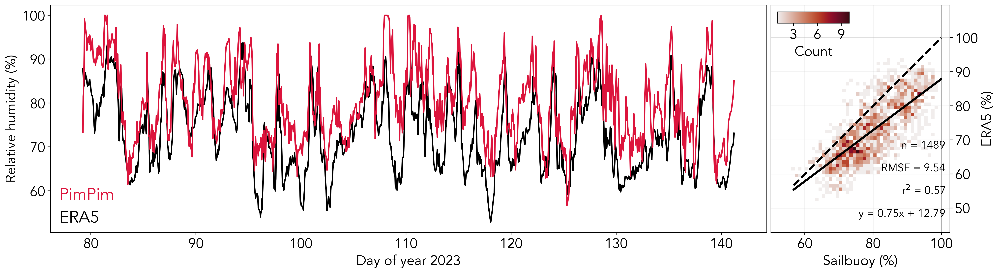

In [344]:
figprops = dict(figsize=(20, 10), dpi=300)
fig = plt.figure(layout="constrained",**figprops)
spec = fig.add_gridspec(nrows=2,ncols=5)

ax = fig.add_subplot(spec[0, :4])
bx = fig.add_subplot(spec[0, 4])#,sharey=ax)

eravar = 'rh'
ppvar = 'rh'

plot_ts_sct(era5,sb_1h,eravar,ppvar,ppc,ax,bx,np.arange(50,100,1))

ax.set(xlabel='Day of year 2023',ylabel='Relative humidity (%)')
bx.set(xlabel='Sailbuoy (%)',ylabel='ERA5 (%)')
ax.set_title('PimPim',loc='left',y=0.125,x=0.012,c=ppc)
ax.set_title('ERA5',loc='right',y=0.025,x=0.012,c='k',ha='left')
#plt.setp(ax.get_xticklabels(), visible=False)
bx.yaxis.tick_right()
bx.yaxis.set_label_position("right")

# ratio = (bx.get_ylim()[1] - bx.get_ylim()[0]) / (bx.get_xlim()[1] - bx.get_xlim()[0])
# bx.set_xlim(80,100)
# bx.set_ylim()


plt.show()

In [346]:
_,_,r,_,_ = stats.linregress(sb_1h['rh'],era5['rh'])
print(f"Full dataset:",fs=20)
print(f"r2 = {(r**2).round(2)}",fs=16)
print(f"RMSE = {calc_rmse(era5,sb_1h,'rh','rh')}",fs=16)
print(f"Bias: {(sb_1h['rh']-era5['rh']).mean('time').values.round(2)}",fs=16)
print(f"Bias: {(sb_1h['rh'].mean('time')-era5['rh'].mean('time')).values.round(2)}",fs=16)
print(f"n = {len(sb_1h['rh'])}",fs=16)


<span style='font-size: 20px;'>Full dataset:</span>

<span style='font-size: 16px;'>r2 = 0.57</span>

<span style='font-size: 16px;'>RMSE = 9.54</span>

<span style='font-size: 16px;'>Bias: 7.22</span>

<span style='font-size: 16px;'>Bias: 7.22</span>

<span style='font-size: 16px;'>n = 1489</span>

In [8]:
era5['t2mc'] = era5['t2m'] - 273.15

KeyError: 't2m'

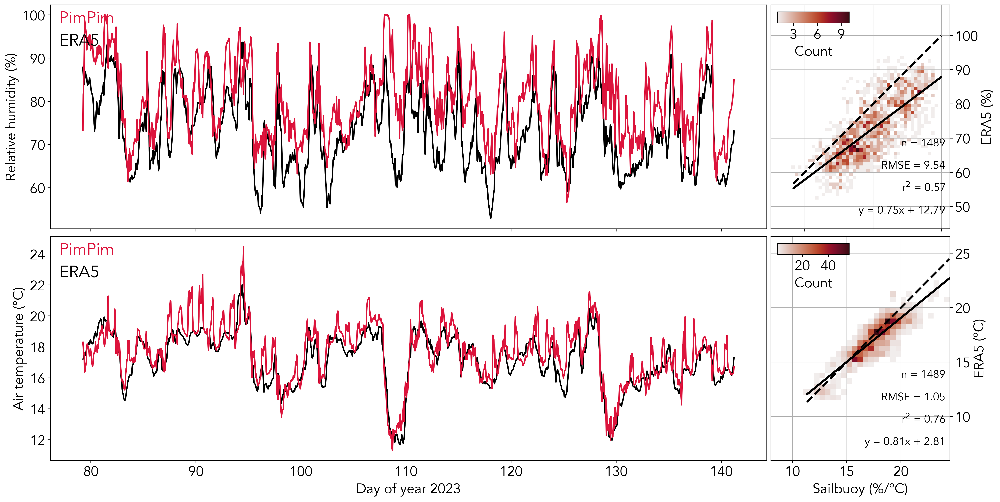

In [355]:
figprops = dict(figsize=(20, 10), dpi=300)
fig = plt.figure(layout="constrained",**figprops)
spec = fig.add_gridspec(nrows=2,ncols=5)

ax = fig.add_subplot(spec[0, :4])
bx = fig.add_subplot(spec[0, 4])
cx = fig.add_subplot(spec[1, :4],sharex=ax)
dx = fig.add_subplot(spec[1, 4])

plot_ts_sct(era5,sb_1h,'rh','rh',ppc,ax,bx,np.arange(50,100,1))
plot_ts_sct(era5,sb_1h,'t2mc','air_t',ppc,cx,dx,np.arange(8,25,0.5))

for i in range(2):
    [ax,cx][i].set(xlabel=['','Day of year 2023'][i],ylabel=['Relative humidity (%)','Air temperature (°C)'][i])
    [bx,dx][i].set(xlabel=['','Sailbuoy (%/°C)'][i],ylabel=['ERA5 (%)','ERA5 (°C)'][i])
    [ax,cx][i].set_title(['PimPim','PimPim'][i],loc='left',y=0.9,x=0.012,c=[ppc,ppc][i])
    [ax,cx][i].set_title('ERA5',loc='right',y=0.8,x=0.012,c='k',ha='left')
    plt.setp([ax,bx][i].get_xticklabels(), visible=False)
    [bx,dx][i].yaxis.tick_right()
    [bx,dx][i].yaxis.set_label_position("right")

plt.show()

# Validating ERA5 with the help of an OOI Mooring

In [165]:
files = ['/Users/xedhjo/Downloads/deployment0001_GS01SUMO-SBD11-06-METBKA000-telemetered-metbk_a_dcl_instrument_20150218T210659.193000-20151222T181504.784000.nc',
         '/Users/xedhjo/Downloads/deployment0004_GS01SUMO-SBD11-06-METBKA000-telemetered-metbk_a_dcl_instrument_20181204T171137.654000-20200120T095958.435000.nc',
         '/Users/xedhjo/Downloads/deployment0003_GS01SUMO-SBD11-06-METBKA000-telemetered-metbk_a_dcl_instrument_20161125T011201.966000-20181209T164116.154000.nc',
         '/Users/xedhjo/Downloads/deployment0002_GS01SUMO-SBD11-06-METBKA000-telemetered-metbk_a_dcl_instrument_20151214T202021.824000-20161128T070124.679000.nc']

In [188]:
oois = []
for i in range(4):
    oois.append(xr.open_dataset(files[i]).swap_dims({'obs':'time'}).sortby('time'))
ooi = xr.concat(oois,dim='time')
ooi = ooi.sortby('time').sel(time=slice('2017','2019'))

In [257]:
ooi_lat = -54.40717
ooi_lon = -89.20604

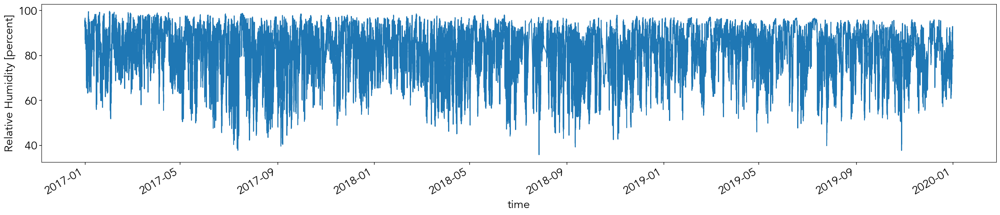

In [347]:
plt.figure(figsize=(30,5))
ooi['relative_humidity'].plot()

In [248]:
era5ooi = xr.open_dataset('/Users/xedhjo/Documents/Projects/2023_Validating_Sailbuoy/data/ERA5_OOI.nc')

In [250]:
ooi_1h = ooi.reset_coords().resample(time='1h').mean('time')

In [276]:
ooi_1h = ooi_1h.where(np.isfinite(ooi_1h['relative_humidity']),drop=True)

In [277]:
ooi_1h = ooi_1h.interpolate_na()

In [278]:
era5_ooi = era5ooi.sel(time=ooi_1h['time'].values).sel(longitude = ooi_lon, method='nearest').sel(latitude = ooi_lat, method='nearest')
era5_ooi['rh'] = ('time'), calc_RH(era5_ooi) * 100

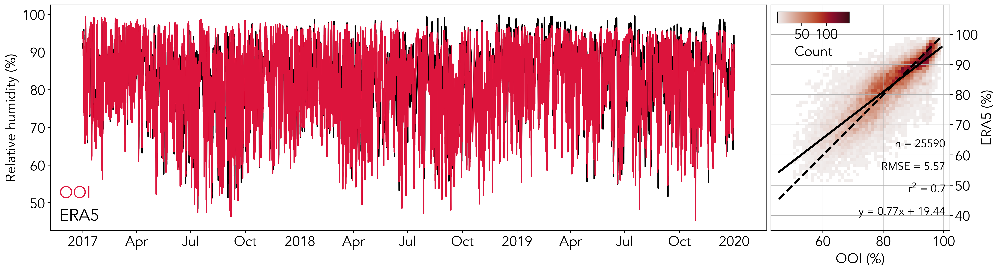

In [337]:
figprops = dict(figsize=(20, 10), dpi=300)
fig = plt.figure(layout="constrained",**figprops)
spec = fig.add_gridspec(nrows=2,ncols=5)

ax = fig.add_subplot(spec[0, :4])
bx = fig.add_subplot(spec[0, 4])#,sharey=ax)

eravar = 'rh'
ooivar = 'relative_humidity'

plot_ts_sct(era5_ooi,ooi_1h,eravar,ooivar,ppc,ax,bx,np.arange(50,100,1),doy=False)

ax.set(xlabel='',ylabel='Relative humidity (%)')
bx.set(xlabel='OOI (%)',ylabel='ERA5 (%)')
ax.set_title('OOI',loc='left',y=0.125,x=0.012,c=ppc)
ax.set_title('ERA5',loc='right',y=0.025,x=0.012,c='k',ha='left')
#plt.setp(ax.get_xticklabels(), visible=False)
bx.yaxis.tick_right()
bx.yaxis.set_label_position("right")

plt.show()

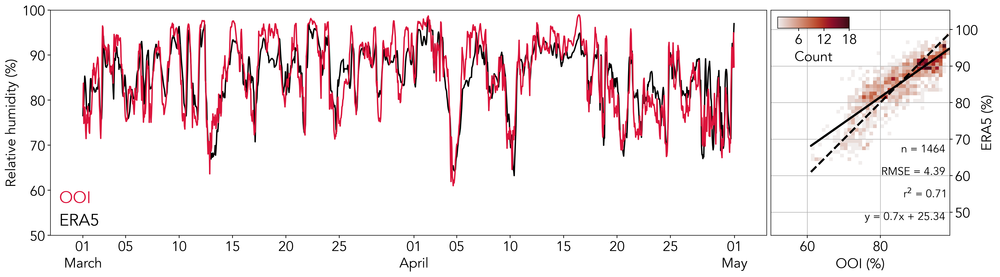

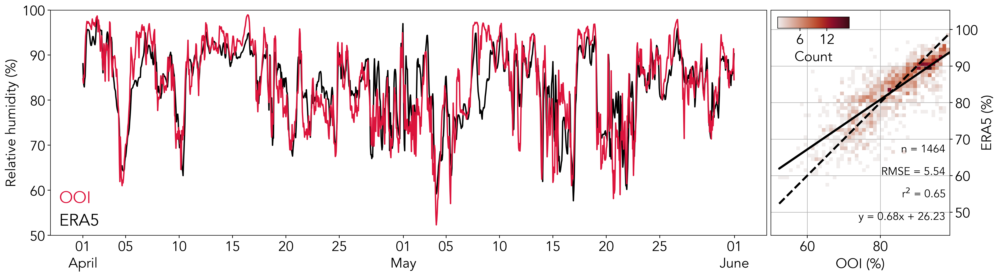

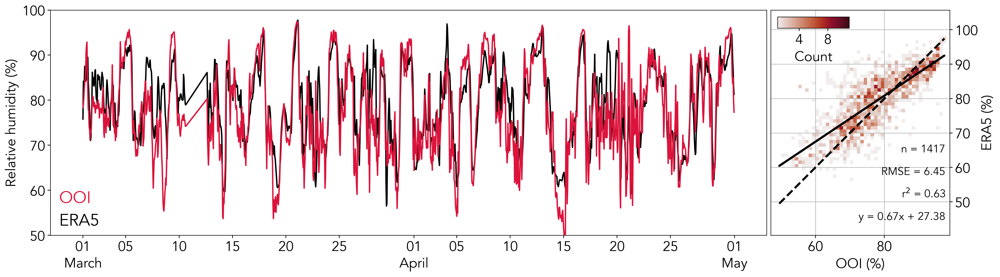

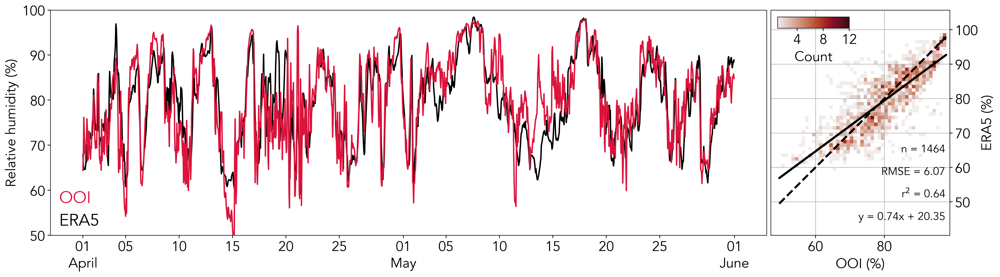

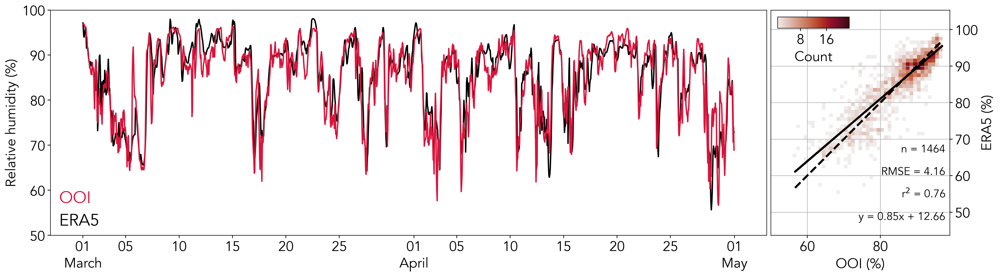

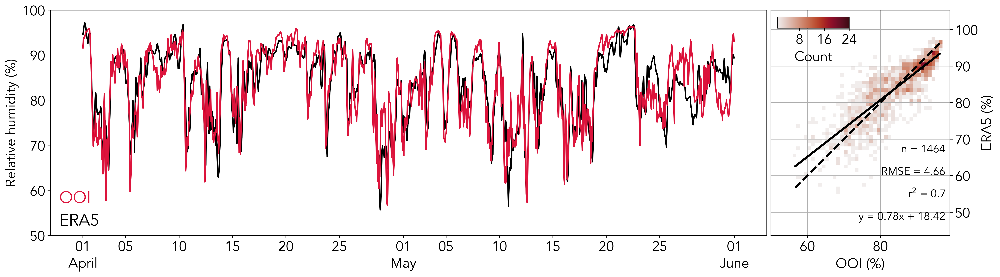

In [370]:
for months in [slice('2017-03','2017-04'),
               slice('2017-04','2017-05'),
               slice('2018-03','2018-04'),
               slice('2018-04','2018-05'),
               slice('2019-03','2019-04'),
               slice('2019-04','2019-05')]:


    figprops = dict(figsize=(20, 10), dpi=300)
    fig = plt.figure(layout="constrained",**figprops)
    spec = fig.add_gridspec(nrows=2,ncols=5)

    ax = fig.add_subplot(spec[0, :4])
    bx = fig.add_subplot(spec[0, 4])#,sharey=ax)

    eravar = 'rh'
    ooivar = 'relative_humidity'

    plot_ts_sct(era5_ooi.sel(time=months),ooi_1h.sel(time=months),eravar,ooivar,ppc,ax,bx,np.arange(50,100,1),doy=False)

    ax.set(xlabel='',ylabel='Relative humidity (%)',ylim=(50,100))
    bx.set(xlabel='OOI (%)',ylabel='ERA5 (%)')
    ax.set_title('OOI',loc='left',y=0.125,x=0.012,c=ppc)
    ax.set_title('ERA5',loc='right',y=0.025,x=0.012,c='k',ha='left')
    #plt.setp(ax.get_xticklabels(), visible=False)
    bx.yaxis.tick_right()
    bx.yaxis.set_label_position("right")

    plt.show()

In [31]:
ds = xr.open_dataset('/Users/xedhjo/Documents/Projects/2023_Validating_Sailbuoy/data/ERA5_AREA_QUICCHE.nc').mean('expver',keep_attrs=True)
adt = xr.open_dataset('/Users/xedhjo/Desktop/ssh_monthly_climatology_2004-2021.nc').adt

In [32]:
ds

<xarray.Dataset>
Dimensions:    (longitude: 121, latitude: 121, time: 2208)
Coordinates:
  * longitude  (longitude) float32 0.0 0.25 0.5 0.75 ... 29.25 29.5 29.75 30.0
  * latitude   (latitude) float32 -30.0 -30.25 -30.5 ... -59.5 -59.75 -60.0
  * time       (time) datetime64[ns] 2023-03-01 ... 2023-05-31T23:00:00
Data variables:
    u10        (time, latitude, longitude) float32 -2.561 -2.69 ... 1.701 1.27
    v10        (time, latitude, longitude) float32 0.1882 0.136 ... -10.73
    d2m        (time, latitude, longitude) float32 287.9 287.5 ... 272.2 272.1
    t2m        (time, latitude, longitude) float32 294.0 294.0 ... 272.9 272.9
Attributes:
    Conventions:  CF-1.6
    history:      2023-06-16 12:56:16 GMT by grib_to_netcdf-2.25.1: /opt/ecmw...

In [ ]:
def calc_es(ds,T):
    a1 = 611.21
    a3 = 17.502
    a4 = 32.19
    T0 = 273.16
    es = a1 * np.exp(a3 * (ds[T].values-T0)/(ds[T].values)-a4)
    return es

def calc_RH(ds):
    RH = calc_es(ds,'d2m') / calc_es(ds,'t2m')
    return RH

In [33]:
ds['rh'] = ('time','latitude','longitude'), calc_RH(ds) * 100

In [23]:
def plot_fronts(ax,month,c,s,z):

    cs = adt.sel(month=7).plot.contour(levels=[-0.035, # SAF
                                               -0.61,  # PF
                                               -0.985, # SAACF
                                               -1.14], # SBDY
                                       ax=ax,
                                       zorder=z,
                                       transform=ccrs.PlateCarree(),
                                       colors=c,
                                       linestyles=s,
                                       linewidths=1)


In [26]:
lon_range = [0,30]
lat_range = [-60,-30]

In [56]:
print(pd.to_datetime(ds.time[0].values.astype('datetime64[s]')))

<span style='font-size: 20px;'>2023-03-01 00:00:00</span>

In [59]:
str(4).zfill(4)

'0004'

In [ ]:
    
for i in tqdm(range(len(ds.time.values)),'Plotting shit...'):

    figprops = dict(figsize=(12, 9), dpi=150)
    fig = plt.figure(layout="constrained",**figprops)
    spec = fig.add_gridspec(nrows=1,ncols=1)

    ax = fig.add_subplot(spec[:, :],projection=ccrs.PlateCarree())

    ds['rh'].isel(time=i).plot(ax=ax,cmap=cmo.amp,vmin=50,vmax=100,cbar_kwargs=dict(pad=0.01,label='Relative humidity (%)'))

    ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m',facecolor='0.8',edgecolor='0'),zorder=3)

    gridlines(ax,5,5)

    ax.set_extent([lon_range[0], lon_range[1], lat_range[0], lat_range[1]], ccrs.PlateCarree())

    plot_fronts(ax,3,'w','-',1)

    # Define z-order for the spines, aka frame, so that it's above the map features
    for k, spine in ax.spines.items():  #ax.spines is a dictionary
        spine.set_zorder(12)

    ax.set_title(pd.to_datetime(ds.time[i].values.astype('datetime64[s]')))
    plt.savefig(f'/Users/xedhjo/Documents/Projects/2023_Validating_Sailbuoy/figures/gifs/era5rh/{str(i).zfill(4)}.png')
    plt.close()

Plotting shit...:   0%|          | 0/2208 [00:00<?, ?it/s]

In [1]:
def gifmaker(impath,savepath,duration):

    filenames = []
    for file in glob.glob(impath): # Specify where the images at
        filenames.append(file)
    filenames.sort(key=os.path.getmtime)

    images = list(map(lambda filename: imageio.imread(filename), filenames))

    imageio.mimsave(os.path.join(savepath), images, duration = duration) # modify duration as needed

In [ ]:
gifmaker(f'/Users/xedhjo/Documents/Projects/2023_Validating_Sailbuoy/figures/gifs/era5rh/*.png',
             f'/Users/xedhjo/Documents/Projects/QUICCHE/figs/Relative_humidity_QUICCHE.gif',
             0.1)

/var/folders/kv/12hx37w96j39x9h5z7hw8hy40000gn/T/ipykernel_25497/2352723904.py:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images = list(map(lambda filename: imageio.imread(filename), filenames))


In [2]:
import imageio as imageio